# EKF Test

## Introduction

In this notebook, (I) a probabilistic ODE solver based on Gaussian inference (/Extended Kalman Filtering (EKF)) is compared against (II) a perturbation-based solver.

An embedded Runge-Kutta (RK) solver (RKF4(5)) $\phi_{RK}$ is used to solve the ODE, providing an estimate $\epsilon_{t+h}$ for the local truncation error at every timestep, based on the input $x_t$.

For both (I) and (II), the uncertainty is then gained from this $\epsilon_{t+h}$ at time $t+h$:

We consider the probabilistic transition model $p(x_{t+h} \mid x_t) = \mathcal{N}(x_{t+h}; \phi_{RK}(x_t), \Sigma_{t+h})$, where $\Sigma_{t+h} = g(\epsilon_{t+h})$.

For the function $g$, we test 
- a simple diagonal covariance ($g(\epsilon_{t+h}) = \text{diag}(\epsilon_{t+h})$, implying full independence between the state's dimensions),
- a outer product covariance ($g(\epsilon_{t+h}) = \epsilon_{t+h} \epsilon_{t+h}^T$, implying dependence between the state's dimensions provided by $\epsilon_{t+h}$, as the only non-zero-valued eigenvector of this covariance is $\epsilon_{t+h}$).

The probabilistic model can be reformulated as

$x_{t+h} = \phi_{RK}(x_t) + \sigma_{t+h}, \qquad \sigma_{t+h} \sim \mathcal{N}(0, \Sigma_{t+h})$

$x_{t+h} = \phi_{RK}(x_t) + \Sigma_{t+h}^{1/2} q, \qquad q \sim \mathcal{N}(0, I)$

$x_{t+h} = f(x_t, q), \qquad q \sim \mathcal{N}(0, I)$,

which fits the setting of the EKF in the non-additive noise case (note that $\epsilon_{t+h}$, and in consequence, $\Sigma_{t+h}$ depend through $\phi_{RK}$ on $x_t$ too).

According to [1], the EKF-based solver takes the solution suggested by the RK solver $\phi_{RK}(x_t)$ as its mean $m_{t+h}$, whereas the covariance $P_{t+h}$ is computed as $F_x(m_t) P_t F_x^T(m_t) + F_q(m_t) Q_t F_q^T(m_t)$.

Here, $F_x(m_t)$ and $F_q(m_t)$ denote the Jacobians of the result $x_{t+h}$ w.r.t. $x_t$ and $q$, respectively, and $Q_t$ refers to the covariance of the Gaussian $q$ is drawn from.

Inspecting the reformulation of the probabilistic model above, we have $Q_t = I$ and $F_q(m_t) = \Sigma_{t+h}^{1/2}$, simplifying the expression to

$P_{t+h} = F_x(m_t) P_t F_x^T(m_t) + \Sigma_{t+h}$.

Last, $F_x(m_t)$ can be computed by differentiating through the RK-solver step, employing auto-diff capabilities of computation frameworks.

The perturbation-based solver (II), on the other hand, applies perturbations by drawing $N=100$ times per timestep from the local error distribution $\sigma_{t+h} \sim \mathcal{N}(0, \Sigma_{t+h})$ and adding them to the solution of the RK-solver $\phi_{RK}(x_t)$.

Here, at the very first step, all perturbations are added to the one solution on the initial state $\phi_{RK}(x_0)$, while further perturbations are applied individually for each of the $N$ sample paths, keeping the total number of sample paths constant.

---

[1]: Särkkä, S., & Svensson, L. (2023). Bayesian filtering and smoothing (Second edition). Cambridge university press.

## Overview

The remainder of this notebook is structured as follows:

Two ODEs (Van-der-Pol oscillator, Lorenz attractor) are tested, next to the two aforementioned $\Sigma$-functions $g$ (diagonal, outer product), yielding four experimental settings.

For each of these settings, one dedicated section shows results of the comparison between the EKF-based and the perturbation-based solver across various step sizes.

Each section contains two plots, both of which depict the solutions of the EKF-based solver as black line (mean) with shaded error-bands (square-root of the covariance matrix's diagonal).

Regarding the perturbation-based solver, the first plot shows all sample paths as colored lines, whereas the second plot visualizes the results using a Gaussian model as well, parametrized by the empirical mean and the empirical standard deviations per state dimension.

Finally, as a ground-truth estimate, a dashed black line illustrates the RK-solver's solution for the smallest applied step size.

In [1]:
from glob import glob
from pathlib import Path
import sys
sys.path.append("../")

from jax import numpy as jnp
from jax import Array
import h5py

In [2]:
paths = {"Lorenz Attractor (Diag)": "../results/perturbation/lorenz/dt__*.h5", 
         "Lorenz Attractor (Outer)": "../results/perturbation/lorenz_outer/dt__*.h5", 
         "Van der Pol Oscillator (Diag)": "../results/perturbation/vanderpol/dt__*.h5", 
         "Van der Pol Oscillator (Outer)": "../results/perturbation/vanderpol_outer/dt__*.h5"}

results_perturbations = {k: {float(Path(file).name.removeprefix("dt__").removesuffix(".h5").replace("_", ".")): h5py.File(file) for file in glob(path)} for k, path in paths.items()}

In [3]:
paths = {"Lorenz Attractor (Diag)": "../results/ekf/lorenz_diag/dt__*.h5", 
         "Lorenz Attractor (Outer)": "../results/ekf/lorenz_outer/dt__*.h5", 
         "Van der Pol Oscillator (Diag)": "../results/ekf/vanderpol_diag/dt__*.h5", 
         "Van der Pol Oscillator (Outer)": "../results/ekf/vanderpol_outer/dt__*.h5"}

results_ekf = {k: {float(Path(file).name.removeprefix("dt__").removesuffix(".h5").replace("_", ".")): h5py.File(file) for file in glob(path)} for k, path in paths.items()}

In [4]:
from matplotlib import pyplot as plt
from matplotlib.ticker import LogFormatterExponent
from matplotlib.lines import Line2D
from tueplots import bundles
from tueplots.constants.color import rgb

plt.rcParams.update(bundles.beamer_moml())
colors_eps = [rgb.tue_red, rgb.tue_blue, rgb.tue_green]
color_true = rgb.tue_dark

In [5]:
def closest_t_indices(reference: Array, test: Array) -> Array:
    # https://stackoverflow.com/a/20785149
    
    idx1 = jnp.searchsorted(reference, test)
    idx2 = jnp.clip(idx1 - 1, 0, len(reference) - 1)

    diff1 = reference[idx1] - test
    diff2 = test - reference[idx2]

    return jnp.where(diff1 <= diff2, idx1, idx2)

# Van-der-Pol Oscillator (Diagonal Sigma)

**NOTE:**

Poor visualization at maximum step size 0.1 is caused by exploding sample paths. Interestingly, this is not emerging with the outer-product computation of $\Sigma$.

The later lowering of uncertainty for the EKF-based solver at step size 0.095 could be caused by the EKF's linearization, but needs further investigation. 

In [32]:
ode_name = "Van der Pol Oscillator (Diag)"
C = 2
rp = results_perturbations[ode_name]
rf = results_ekf[ode_name]
min_dt = min(rp.keys() & rf.keys())
dts_sorted = sorted(list(rp.keys() & rf.keys()))
max_std = jnp.inf

def fn_label(idx):
    if idx > 1:
        return f"$d^{idx+1}x(t)/dt^{idx+1}$"
    elif idx == 1:
        return f"$dx(t)/dt$"
    else:
        return f"$x(t)$"

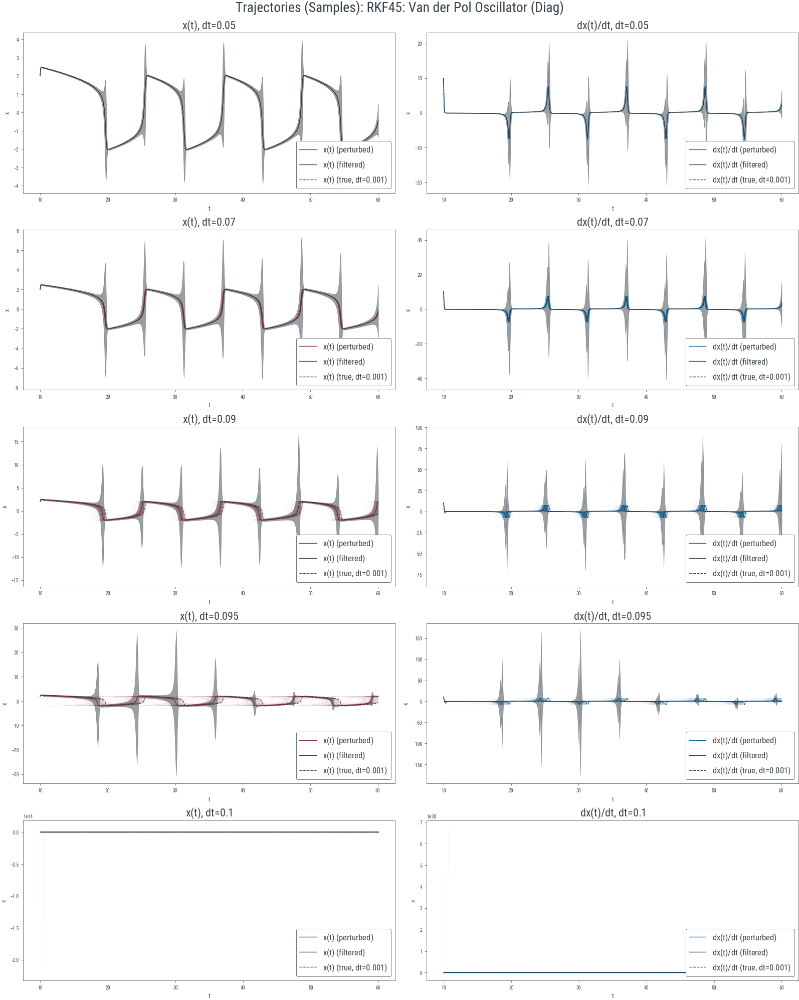

In [33]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
        
        ax.plot(ts_f, xs_f[:, col, 0], color=color_true)
        ax.fill_between(ts_f, xs_f[:, col, 0] - std_f[:, col], xs_f[:, col, 0] + std_f[:, col], color=color_true, alpha=0.5)
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts_p, xs_eps_p[:, idx, col, 0], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts_p, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

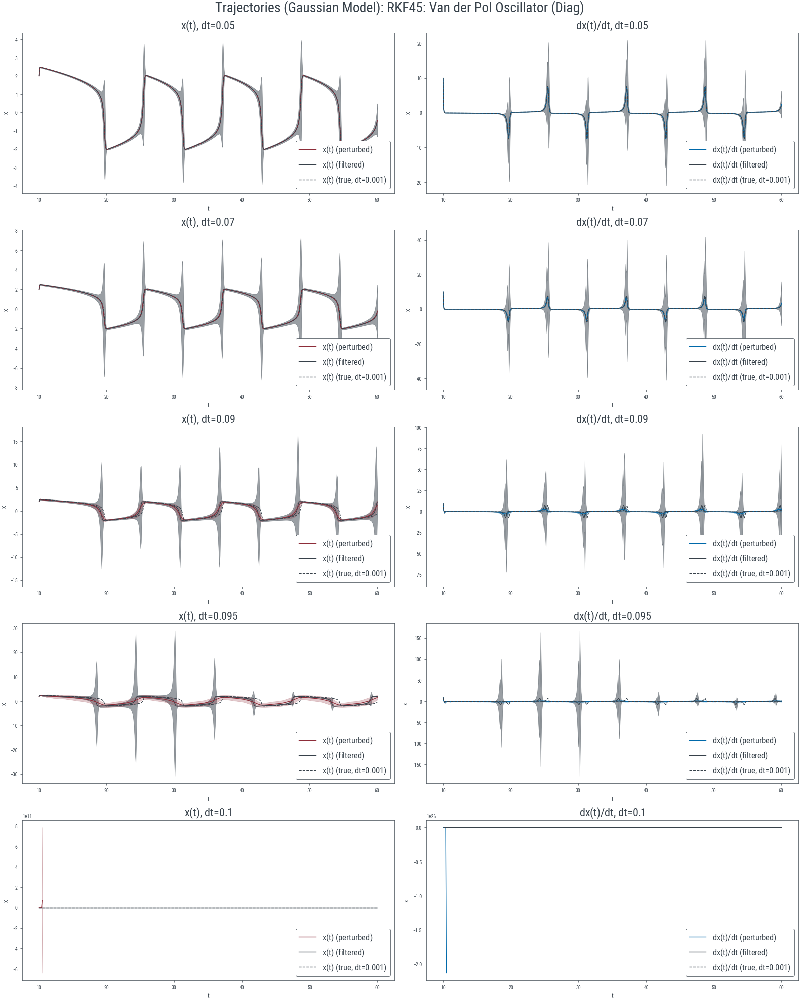

In [34]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, col, 0], axis=1)
        std = jnp.std(xs_eps_p[:, :, col, 0], ddof=1, axis=1)
        ax.plot(ts_f, xs_f[:, col, 0], color=color_true)
        ax.fill_between(ts_f, xs_f[:, col, 0] - std_f[:, col], xs_f[:, col, 0] + std_f[:, col], color=color_true, alpha=0.5)
        ax.plot(ts_p, mean, color=colors_eps[col])
        ax.fill_between(ts_p, mean - std, mean + std, color=colors_eps[col], alpha=0.25)
        ax.plot(ts_p, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);

# Van-der-Pol Oscillator (Outer Product Sigma)

In [35]:
ode_name = "Van der Pol Oscillator (Outer)"
C = 2
rp = results_perturbations[ode_name]
rf = results_ekf[ode_name]
min_dt = min(rp.keys() & rf.keys())
dts_sorted = sorted(list(rp.keys() & rf.keys()))
max_std = jnp.inf

def fn_label(idx):
    if idx > 1:
        return f"$d^{idx+1}x(t)/dt^{idx+1}$"
    elif idx == 1:
        return f"$dx(t)/dt$"
    else:
        return f"$x(t)$"

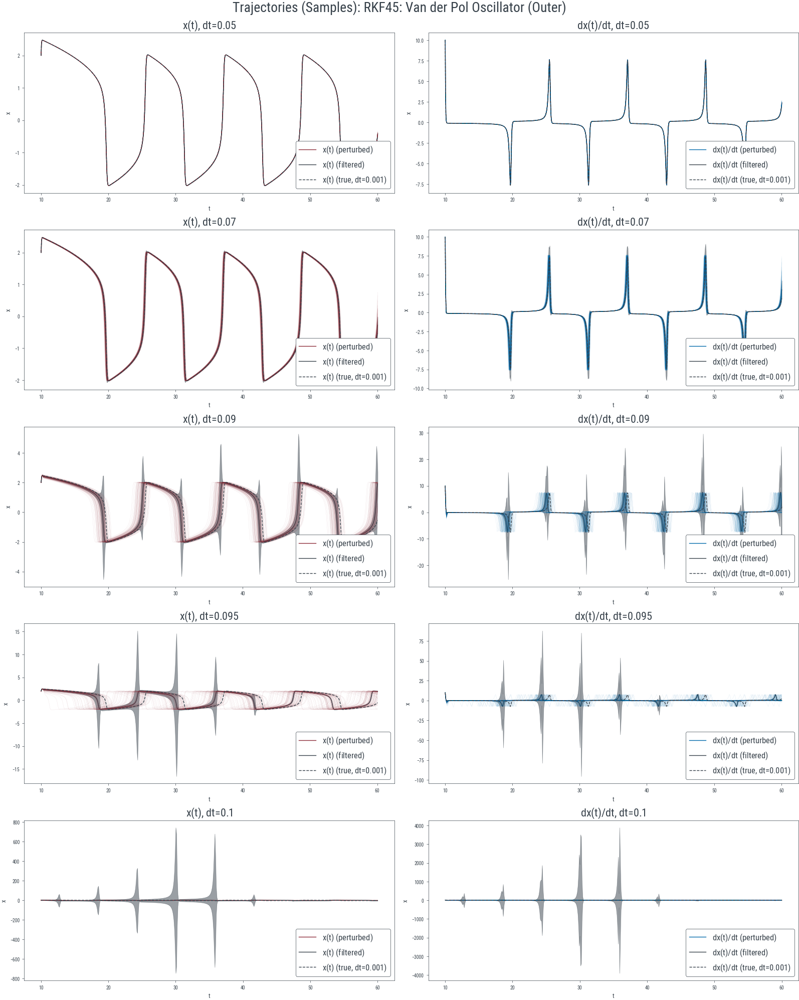

In [36]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
        
        ax.plot(ts_f, xs_f[:, col, 0], color=color_true)
        ax.fill_between(ts_f, xs_f[:, col, 0] - std_f[:, col], xs_f[:, col, 0] + std_f[:, col], color=color_true, alpha=0.5)
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts_p, xs_eps_p[:, idx, col, 0], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts_p, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

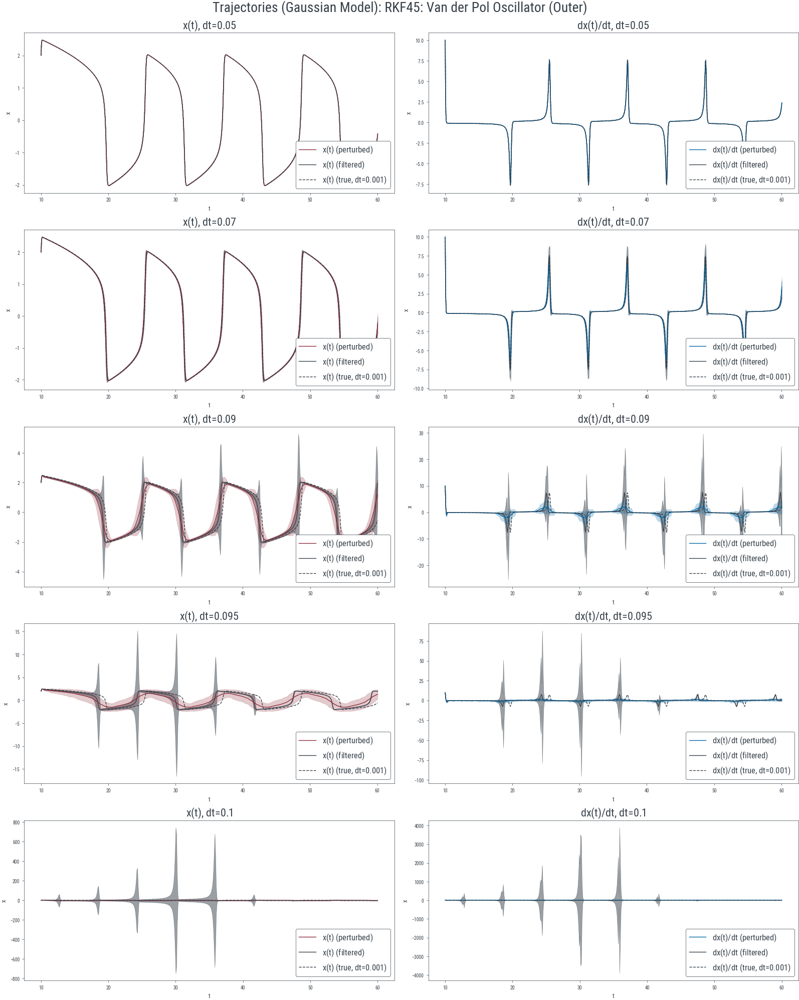

In [37]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, col, 0], axis=1)
        std = jnp.std(xs_eps_p[:, :, col, 0], ddof=1, axis=1)
        ax.plot(ts_f, xs_f[:, col, 0], color=color_true)
        ax.fill_between(ts_f, xs_f[:, col, 0] - std_f[:, col], xs_f[:, col, 0] + std_f[:, col], color=color_true, alpha=0.5)
        ax.plot(ts_p, mean, color=colors_eps[col])
        ax.fill_between(ts_p, mean - std, mean + std, color=colors_eps[col], alpha=0.25)
        ax.plot(ts_p, xs_true_cap[:, col, 0], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);

## Lorenz Attractor

**NOTE:** 

As the covariances generated by the EKF-based solver rapidly explode when the predicted trajectory begins to diverge from the true trajectory, the standard deviation shown in below plots is capped at 10. 

However, with the calibration being quite appealing apart from that, it could be interesting to treat this as a parameter of the solver and apply the capping not only for visualization purposes, but right at filtering time (though being a bit hacky).
Would it affect the "remaining" calibration in a negative way?

In [20]:
ode_name = "Lorenz Attractor (Diag)"
C = 3
rp = results_perturbations[ode_name]
rf = results_ekf[ode_name]
min_dt = min(rp.keys() & rf.keys())
dts_sorted = sorted(list(rp.keys() & rf.keys()))
max_std = 10.

def fn_label(idx):
    map_idx = {0: "x", 1: "y", 2: "z"}
    return f"{map_idx[idx]}(t)"

## Trajectories

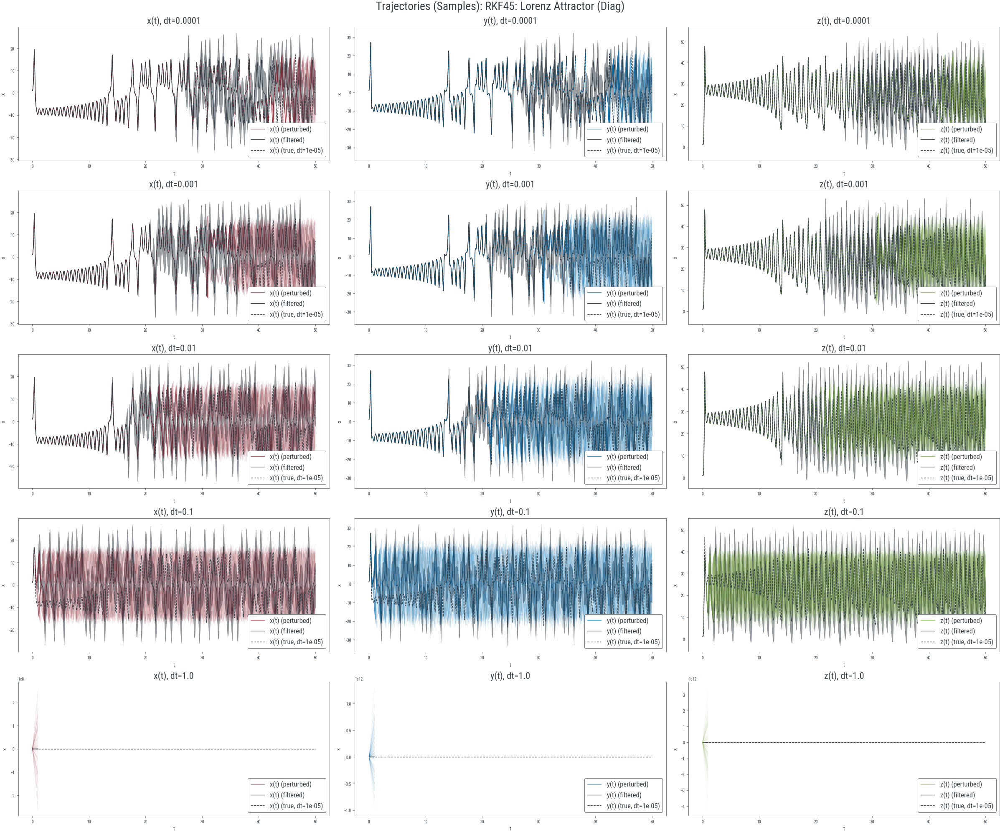

In [21]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
        
        ax.plot(ts_f, xs_f[:, 0, col], color=color_true)
        ax.fill_between(ts_f, xs_f[:, 0, col] - std_f[:, col], xs_f[:, 0, col] + std_f[:, col], color=color_true, alpha=0.5)
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts_p, xs_eps_p[:, idx, 0, col], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts_p, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

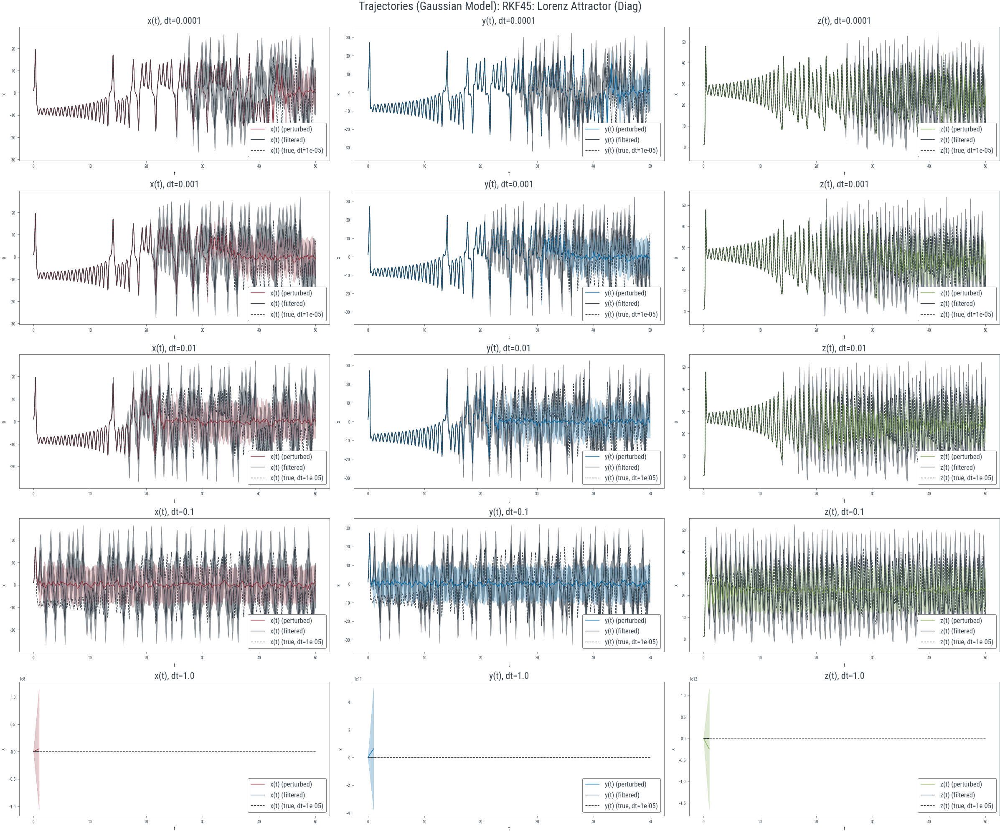

In [22]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, 0, col], axis=1)
        std = jnp.std(xs_eps_p[:, :, 0, col], ddof=1, axis=1)
        ax.plot(ts_f, xs_f[:, 0, col], color=color_true)
        ax.fill_between(ts_f, xs_f[:, 0, col] - std_f[:, col], xs_f[:, 0, col] + std_f[:, col], color=color_true, alpha=0.5)
        ax.plot(ts_p, mean, color=colors_eps[col])
        ax.fill_between(ts_p, mean - std, mean + std, color=colors_eps[col], alpha=0.25)
        ax.plot(ts_p, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);

# Lorenz Attractor (Outer Product Sigma)

In [23]:
ode_name = "Lorenz Attractor (Outer)"
C = 3
rp = results_perturbations[ode_name]
rf = results_ekf[ode_name]
min_dt = min(rp.keys() & rf.keys())
dts_sorted = sorted(list(rp.keys() & rf.keys()))
max_std = 10.

def fn_label(idx):
    map_idx = {0: "x", 1: "y", 2: "z"}
    return f"{map_idx[idx]}(t)"

## Trajectories

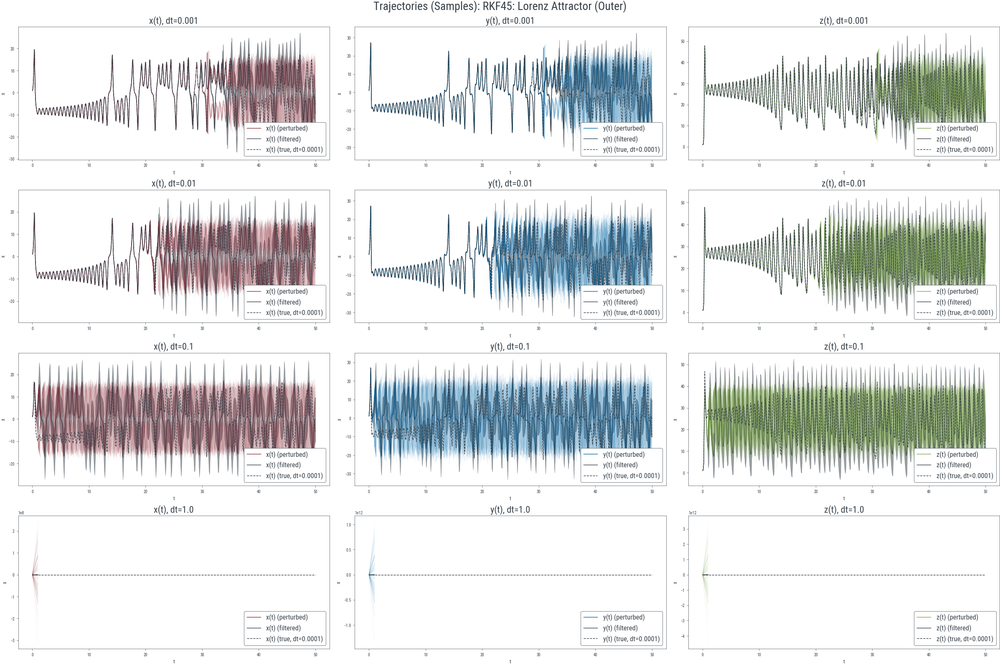

In [24]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
        
        ax.plot(ts_f, xs_f[:, 0, col], color=color_true)
        ax.fill_between(ts_f, xs_f[:, 0, col] - std_f[:, col], xs_f[:, 0, col] + std_f[:, col], color=color_true, alpha=0.5)
        for idx in range(xs_eps_p.shape[1]):
            ax.plot(ts_p, xs_eps_p[:, idx, 0, col], color=colors_eps[col], alpha=0.2, linewidth=0.2)
        ax.plot(ts_p, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Samples): RKF45: {ode_name}", fontsize=20);

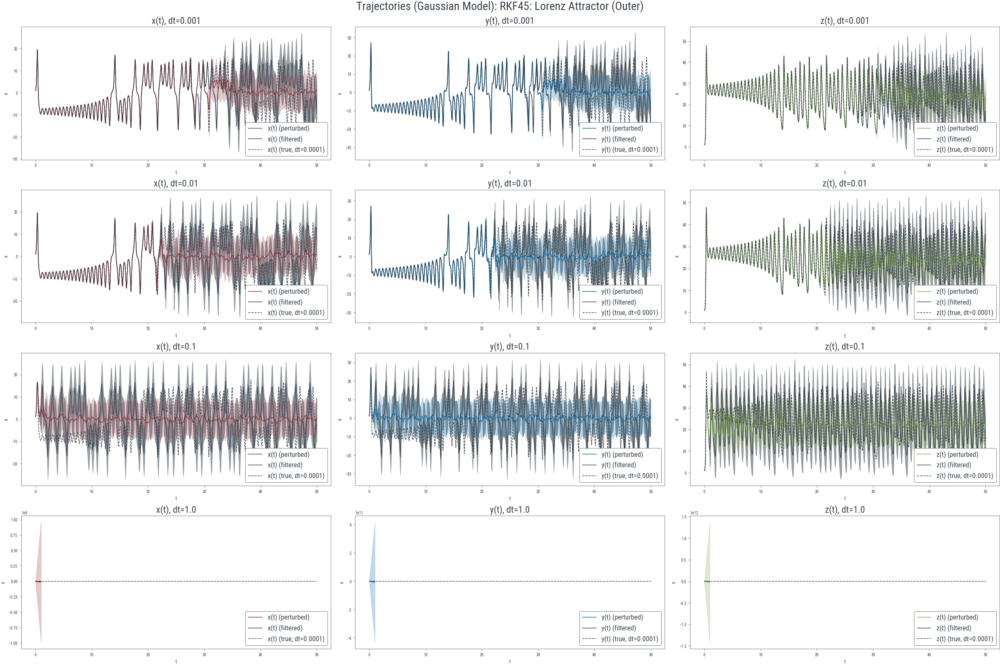

In [25]:
fig, axs = plt.subplots(len(dts_sorted) - 1, C, figsize=(C*8, (len(dts_sorted) - 1)*4))
ts_true, xs_true = jnp.asarray(rp[min_dt]["ts"]), jnp.asarray(rp[min_dt]["xs"])
for row, dt in enumerate(dts_sorted[1:]):
    ts_p, xs_eps_p = jnp.asarray(rp[dt]["ts"]), jnp.asarray(rp[dt]["xs_eps_p"])
    ts_f, xs_f, Ps_f =  jnp.asarray(rf[dt]["ts"]), jnp.asarray(rf[dt]["xs"]), jnp.asarray(rf[dt]["Ps"])
    std_f = jnp.minimum(jnp.sqrt(jnp.diagonal(Ps_f, axis1=1, axis2=2)), max_std)
    for col in range(C):
        ax = axs[row, col]
        t_indices = closest_t_indices(ts_true, ts_p)
        xs_true_cap = xs_true[t_indices]
            
        mean = jnp.mean(xs_eps_p[:, :, 0, col], axis=1)
        std = jnp.std(xs_eps_p[:, :, 0, col], ddof=1, axis=1)
        ax.plot(ts_f, xs_f[:, 0, col], color=color_true)
        ax.fill_between(ts_f, xs_f[:, 0, col] - std_f[:, col], xs_f[:, 0, col] + std_f[:, col], color=color_true, alpha=0.5)
        ax.plot(ts_p, mean, color=colors_eps[col])
        ax.fill_between(ts_p, mean - std, mean + std, color=colors_eps[col], alpha=0.25)
        ax.plot(ts_p, xs_true_cap[:, 0, col], ls="--", color=color_true)
        ax.set_xlabel("$t$")
        ax.set_ylabel("$x$")
        
        handles = [Line2D([0], [0], label=fn_label(col) + " (perturbed)", color=colors_eps[col]),
                   Line2D([0], [0], label=fn_label(col) + " (filtered)", color=color_true), 
                    Line2D([0], [0], ls="--", label=fn_label(col) + f" (true, dt={min_dt})", color=color_true)]
        ax.set_title(fn_label(col) + f", dt={dt}", fontsize=16)
        ax.legend(handles=handles, fontsize=12, loc="lower right", facecolor='white', framealpha=1)
fig.suptitle(f"Trajectories (Gaussian Model): RKF45: {ode_name}", fontsize=20);